In [1]:
import os
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import glob
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [43]:
from src.params import ROOT_DIR
from src.fig_utils import helper_save
from src.plot_umap_embeddings import plot_embedding_features, load_data, main_command_line

In [3]:
os.chdir(ROOT_DIR)

In [4]:
norm= 'log10'
dim = "umap"
min_neighbor = "200"
min_distance = "0.0"
sim = 0
min_sample = 100
min_cluster_size = 30
cluster = "hdb"

In [5]:
data_f = f"data/processed/transform/data_df_{norm}.p"
meta_f = f"data/processed/meta.tsv"
umap_f = f"results/{norm}/{dim}_out/{min_neighbor}_{min_distance}/embedding_{sim}.p"
cluster_f = f"results/{norm}/{dim}_out/{min_neighbor}_{min_distance}/{cluster}_out/{min_sample}_{min_cluster_size}.p"
labels_to_keep = "0"

In [6]:
fig_dir = f"figures/{norm}/{dim}_out/{min_neighbor}_{min_distance}/{cluster}_out/{min_sample}_{min_cluster_size}/label{labels_to_keep}"

In [7]:
if not os.path.exists(fig_dir):
    os.makedirs(fig_dir)

In [8]:
data, meta = load_data(data_f, meta_f)
plot_embedding_features(data, meta, umap_f, fig_dir,
                        min_neighbor=min_neighbor, min_distance=min_distance, labels_f=cluster_f, labels_to_keep=labels_to_keep)

In [20]:
data, meta = load_data(data_f, meta_f)
for l in range(1,5):
    print(l)
    fig_dir = f"figures/{norm}/{dim}_out/{min_neighbor}_{min_distance}/{cluster}_out/{min_sample}_{min_cluster_size}/label{l}"
    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)
    plot_embedding_features(data, meta, umap_f, fig_dir,
                            min_neighbor=min_neighbor, min_distance=min_distance, labels_f=cluster_f, labels_to_keep=l)

1
2
3


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


4


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [ ]:
# plot_embedding_features(data, meta, umap_f, fig_dir, min_neighbor=min_neighbor, min_distance=min_distance, 
#                         labels_f=cluster_f, labels_to_keep=labels_to_keep)

## Plot embedding locations kernel density based on time, stimuli, genotype

### Load embeddings

### Merge with meta (and getting only those indices)

### groupby and then plot

In [38]:
stimuli_map = {key:i for i, key in enumerate(curr_df["Stimuli Names"].unique())}
stimuli_map

{'DMSO': 0,
 'zVD': 1,
 'BPT': 2,
 'BPT_zVD': 3,
 'BPT_Nec1s': 4,
 'BPT_zVD_Nec1s': 5,
 'Nec1s': 6,
 'PIK75': 7}

In [9]:

data, meta = load_data(data_f, meta_f)
inp = pickle.load(open(umap_f, "rb"))
if not len(inp) == 2:
    [print("Not loaded")]
embedding,  samples_ind = inp[0], inp[1]





In [50]:
import tqdm

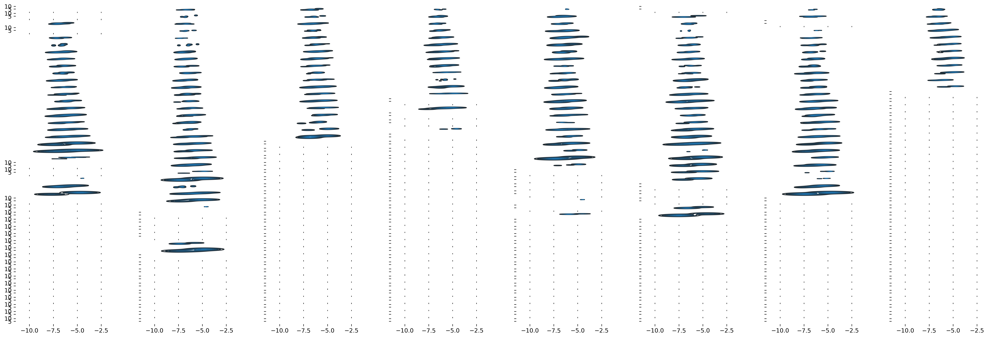

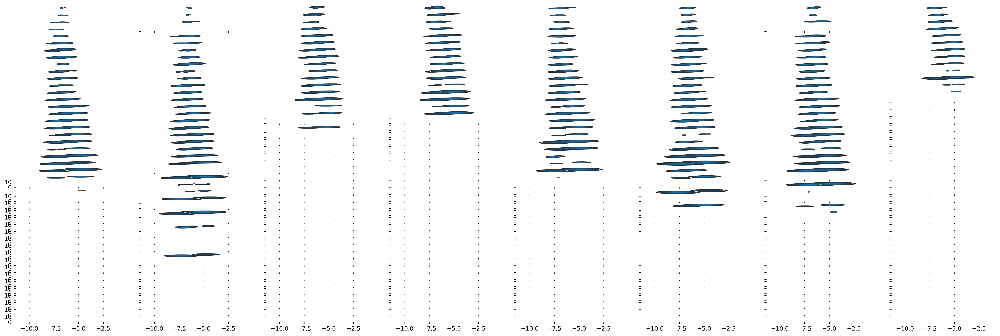

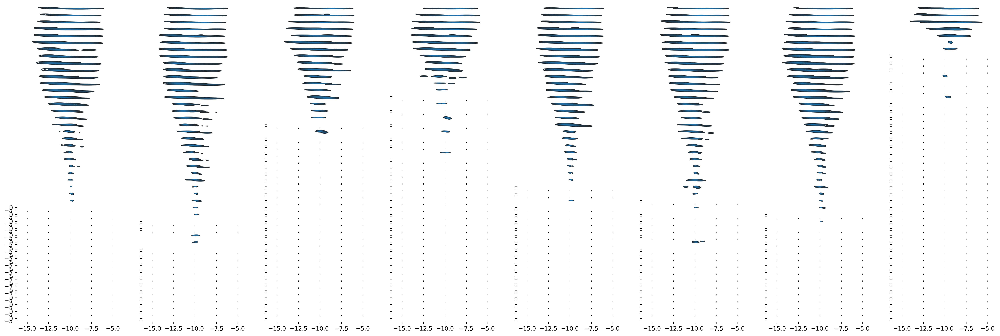

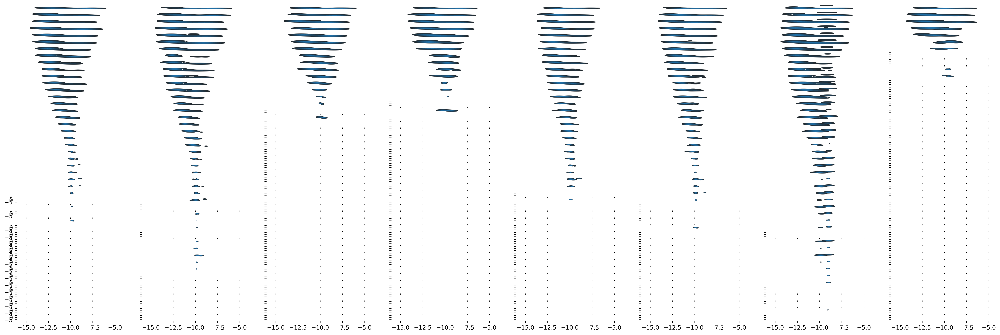

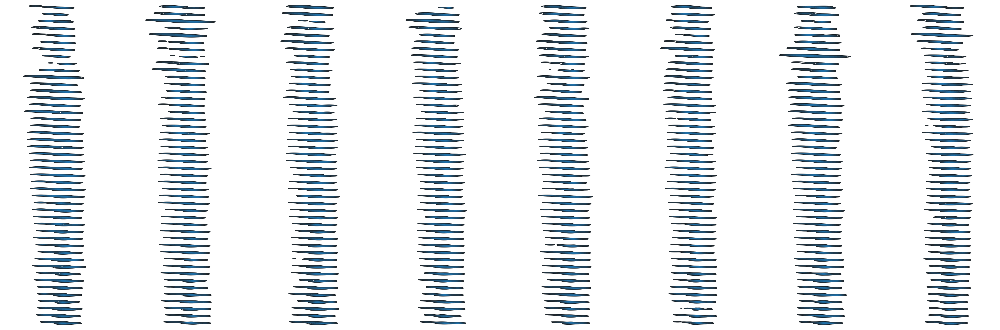

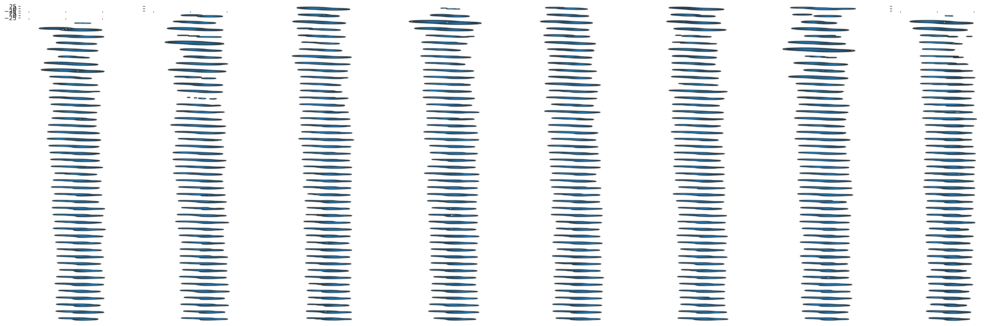

In [58]:
curr_df = meta.loc[samples_ind]
curr_df["embedding_1"] = embedding[:, 0]
curr_df["embedding_2"] = embedding[:, 1]
labels = pickle.load(open(cluster_f, "rb"))
curr_df["Cluster"] = labels
if labels_to_keep is not None:
    curr_df = curr_df[curr_df["Cluster"].astype(str) == str(labels_to_keep)]
labels_to_keep_list = [1,0,2]
for labels_to_keep in labels_to_keep_list:
    curr_df = meta.loc[samples_ind]
    curr_df["embedding_1"] = embedding[:, 0]
    curr_df["embedding_2"] = embedding[:, 1]
    labels = pickle.load(open(cluster_f, "rb"))
    curr_df["Cluster"] = labels
    if labels_to_keep is not None:
        curr_df = curr_df[curr_df["Cluster"].astype(str) == str(labels_to_keep)]
    
    for ind,df in curr_df.groupby("Genotype"):
        f, ax = plt.subplots(nrows= max(curr_df["Timepoint"].unique()), ncols=len(curr_df["Stimuli Names"].unique()), dpi=300, 
                             sharex=True, sharey=True, figsize=(30,10))
        
        for ind2, df2 in tqdm.tqdm_notebook(df.groupby(["Timepoint", "Stimuli Names"])):
            if len(df2) <= 2:
                continue
            sns.kdeplot(df2["embedding_1"], df2["embedding_2"],ax=ax[ind2[0]-1, stimuli_map[ind2[1]]])
            ax[ind2[0]-1, stimuli_map[ind2[1]]].get_yaxis().set_visible(False)
            ax[ind2[0]-1, stimuli_map[ind2[1]]].get_xaxis().set_visible(False)
        helper_save(f"figures/log10/umap_out/200_0.0/hdb_out/label{labels_to_keep}_{ind}_kde", f=f)

## Stratify time by 8 points

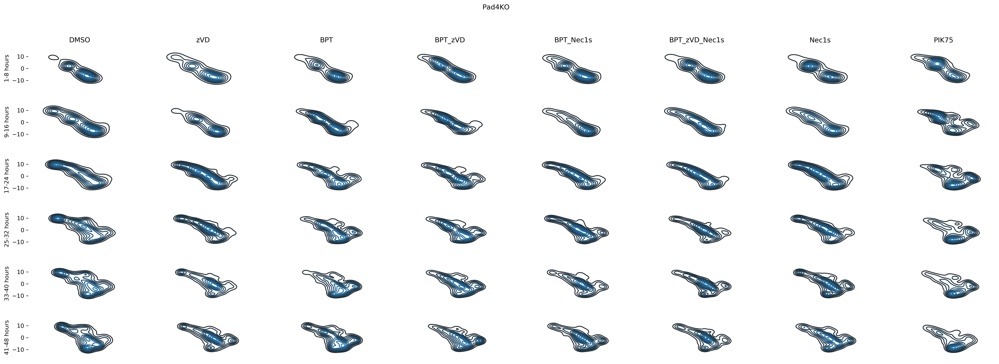

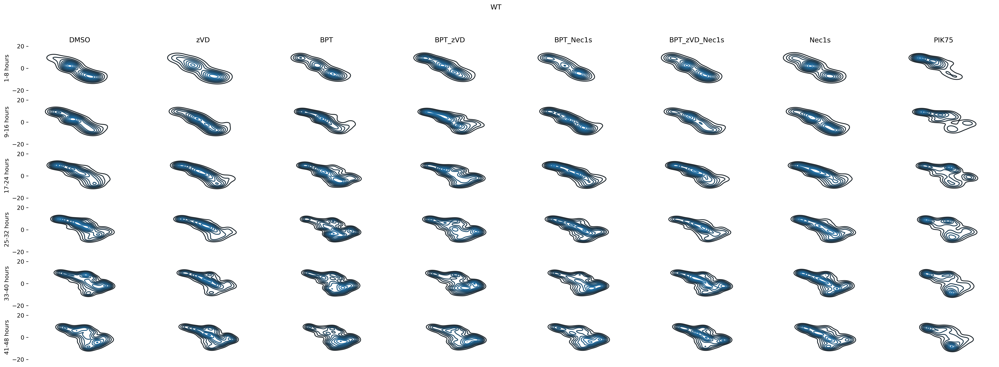

In [89]:
labels_to_keep = 2

curr_df = meta.loc[samples_ind]
curr_df["embedding_1"] = embedding[:, 0]
curr_df["embedding_2"] = embedding[:, 1]
labels = pickle.load(open(cluster_f, "rb"))
curr_df["Cluster"] = labels


if labels_to_keep is not None:
    curr_df = curr_df[curr_df["Cluster"].astype(str) == str(labels_to_keep)]
    for ind,df in curr_df.groupby("Genotype"):
        f, ax = plt.subplots(nrows= int((max(curr_df["Timepoint"])+1)/8) + 1, ncols=len(curr_df["Stimuli Names"].unique()), dpi=300, 
                             sharex=True, sharey=True, figsize=(30,10))

        for ind2, df2 in tqdm.tqdm_notebook(df.groupby( "Stimuli Names")):

            for i in range(1,max(curr_df["Timepoint"])+1, 8):
                toplot = df2[(df2["Timepoint"] >= i) & (df2["Timepoint"] < i+8)]
                if len(toplot) <= 2:
                    continue
                sns.kdeplot(toplot["embedding_1"], toplot["embedding_2"],ax=ax[int(i/8), stimuli_map[ind2]])

                ax[int(i/8), stimuli_map[ind2]].get_yaxis().set_visible(False)
                ax[int(i/8), stimuli_map[ind2]].get_xaxis().set_visible(False)
        for i in stimuli_map:
            ax[0,(stimuli_map[i])].set_title(i)

        for i in range(1,max(curr_df["Timepoint"])+1, 8):
            ax[int(i/8),0].get_yaxis().set_visible(True)
            ax[int(i/8),0].set_ylabel(f"{i}-{i+8-1} hours")

        f.suptitle(ind)
        helper_save(f"figures/log10/umap_out/200_0.0/hdb_out/label{labels_to_keep}_{ind}_kde_timecollapse", f=f)


In [87]:
for i in stimuli_map:
    ax[0,(stimuli_map[i])].set_title(i)
    
for i in range(1,max(curr_df["Timepoint"])+1, 8):
    ax[int(i/8),0].get_yaxis().set_visible(True)
    ax[int(i/8),0].set_ylabel(f"{i}-{i+8-1} hours")


f.suptitle(ind)

Text(0.5, 0.98, 'WT')

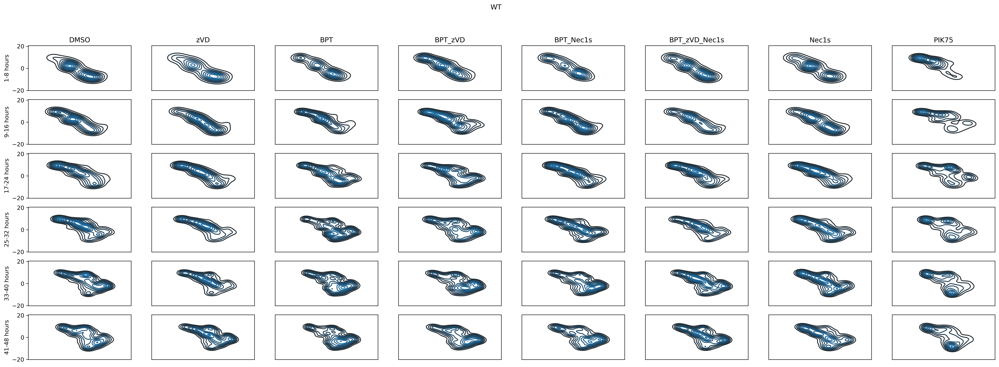

In [88]:
f